In [1]:
%pip install -q ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Load required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from sklearn.decomposition import PCA
from skimage.color import rgb2lab
from ipywidgets import interact, FloatSlider, IntSlider
import sys
from pathlib import Path

# Add the parent directory to the Python path
sys.path.append(str(Path.cwd().parent))

%matplotlib inline

# Data Loading and Preprocessing

This notebook focuses on loading and preparing images for plant detection. The preprocessing steps include:
1. Loading images in various formats.
2. Converting images to different color spaces (LAB, HSV).
3. Calculating vegetation indices to highlight plant regions.
4. Downsampling images for faster processing.

The preprocessed outputs will be used in subsequent analyses.


## Load and Display Image


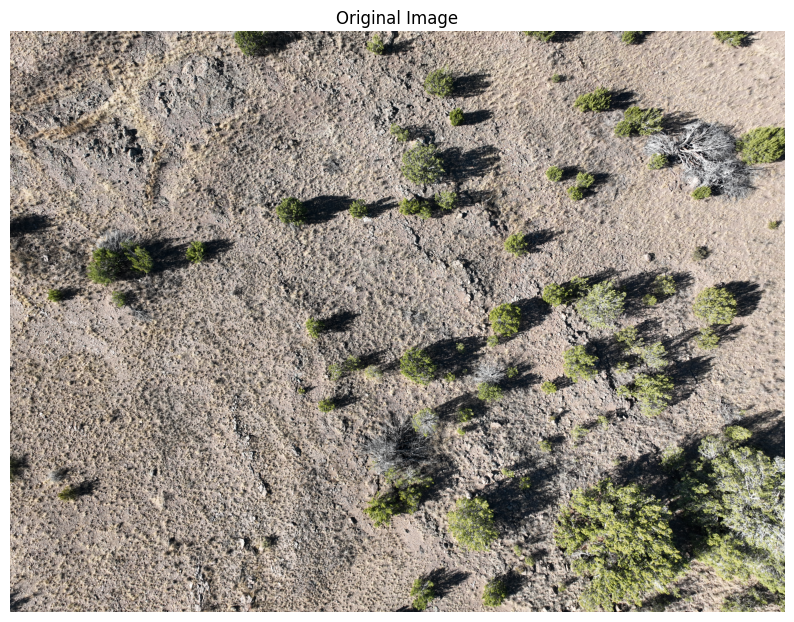

In [14]:
from plant_search.load_image import load_image, plot_image

# file_path = '../input/ESPG-4326-orthophoto.tif'
# file_path = '../input/MADRID_RGB.tif'
# file_path = '../input/aerial-trees.jpg'
# file_path = '../input/DJI_0010.JPG'
# file_path = '../input/DJI_0015.JPG'
file_path = '../input/DJI_0093.JPG'
# file_path = '../input/DJI_0119.JPG'
# file_path = '../input/Brewster-ortho.tif'


image = load_image(file_path)
if image is not None:
    plot_image(image, "Original Image")


## Color Space Transformations
1. **RGB**: Conventional red, green, blue
2. **LAB**: Lightness, A (green-red), B (blue-yellow),
3. **HSV**: Hue, saturation, and value


### LAB Color Space
Expected Results:

- **L**: A grayscale image showing brightness across the image.
- **A**: Red-dominated areas should appear positive (bright), while green-dominated areas should appear negative (dark).
- **B**: Highlights blue-to-yellow dominance.

In [ ]:
# Convert to LAB and HSV color spaces
lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Extract individual channels
r_channel, g_channel, b_channel = cv2.split(image)
l_channel, a_channel, b_channel = cv2.split(lab_image)
h_channel, s_channel, v_channel = cv2.split(hsv_image)

# Create the figure and axes
fig, axes = plt.subplots(3, 3, figsize=(20, 18))

# Add the title to the left of each row
row_titles = ["RGB Channels", "LAB Channels", "HSV Channels"]
for i, title in enumerate(row_titles):
    axes[i, 0].annotate(title, xy=(0, 0.5), xytext=(-axes[i, 0].yaxis.labelpad - 35, 0),
        textcoords="offset points", ha="center", va="center", rotation=90, fontsize=16, fontweight="bold")


rgb_channels = [("Red Channel", r_channel, "Reds"), 
                ("Green Channel", g_channel, "Greens"), 
                ("Blue Channel", b_channel, "Blues")]

for i, (title, channel, cmap) in enumerate(rgb_channels):
    im = axes[0, i].imshow(channel, cmap=cmap)
    axes[0, i].set_title(title, fontsize=14)
    axes[0, i].axis("off")
    cbar = fig.colorbar(im, ax=axes[0, i], orientation="vertical", fraction=0.046, pad=0.04)
    cbar.set_label("Intensity")

# LAB Channels
lab_channels = [("L (Lightness)", l_channel, "gray", "Brightness (Black to White)"), 
                ("A (Green-Red)", a_channel, "PiYG_r", "Green (-) to Red (+)"), 
                ("B (Blue-Yellow)", b_channel, "YlGnBu_r", "Blue (-) to Yellow (+)")]

for i, (title, channel, cmap, cbar_label) in enumerate(lab_channels):
    im = axes[1, i].imshow(channel, cmap=cmap)
    axes[1, i].set_title(title, fontsize=14)
    axes[1, i].axis("off")
    cbar = fig.colorbar(im, ax=axes[1, i], orientation="vertical", fraction=0.046, pad=0.04)
    cbar.set_label(cbar_label)

# HSV Channels
hsv_channels = [("H Channel (HSV)", h_channel, "hsv"), 
                ("S Channel (HSV)", s_channel, "gray"), 
                ("V Channel (HSV)", v_channel, "gray")]

for i, (title, channel, cmap) in enumerate(hsv_channels):
    im = axes[2, i].imshow(channel, cmap=cmap)
    axes[2, i].set_title(title, fontsize=14)
    axes[2, i].axis("off")
    cbar = fig.colorbar(im, ax=axes[2, i], orientation="vertical", fraction=0.046, pad=0.04)
    cbar.set_label("Intensity")

# Adjust layout for spacing and titles
plt.subplots_adjust(hspace=0.3)  # Add vertical spacing between rows
plt.tight_layout(rect=[0.02, 0, 1, 0.94])  # Ensure row titles fit
plt.show()


## Vegetation Indices

- **ExG:** Excess Green Index 
- **GLI:** Green Leaf Index
- **NDI:** Normalized Difference Index
    - Also referred to as **GRVI** (Green-Red Vegetation Index)
    - Highlights areas with strong green dominance over red.
    - Can be useful for identifying chlorophyll content.
- **VARI:** Visible Atmospherically Resistant Index
- **TVI:** Triangular Vegetation Index
    - Captures vegetation vigor through its triangular relationship.
    - Especially useful for robust vegetation assessments.

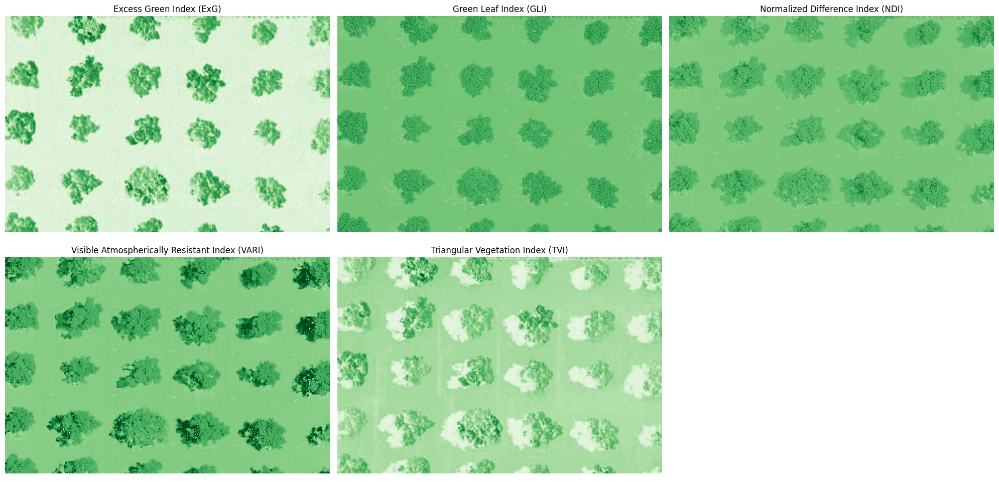

In [ ]:
from plant_search.vegetation_indices import calculate_all_rgb_indices

# Calculate all indices
indices = calculate_all_rgb_indices(image)

# Prepare the indices and titles for plotting
index_titles = [
    ("Excess Green Index (ExG)", indices["ExG"]),
    ("Green Leaf Index (GLI)", indices["GLI"]),
    ("Normalized Difference Index (NDI)", indices["NDI"]),
    ("Visible Atmospherically Resistant Index (VARI)", indices["VARI"]),
    ("Triangular Vegetation Index (TVI)", indices["TVI"]),
]

# Set up the grid for three columns
n_cols = 3
n_rows = (len(index_titles) + n_cols - 1) // n_cols  # Compute rows based on the number of indices
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

# Plot each index
for i, (title, index) in enumerate(index_titles):
    row, col = divmod(i, n_cols)
    axes[row, col].imshow(index, cmap='Greens')
    axes[row, col].set_title(title)
    axes[row, col].axis("off")

# Turn off unused subplots
for i in range(len(index_titles), n_rows * n_cols):
    row, col = divmod(i, n_cols)
    axes[row, col].axis("off")

plt.tight_layout()
plt.show()


### Vegetation Indices Exploratory Data Analysis

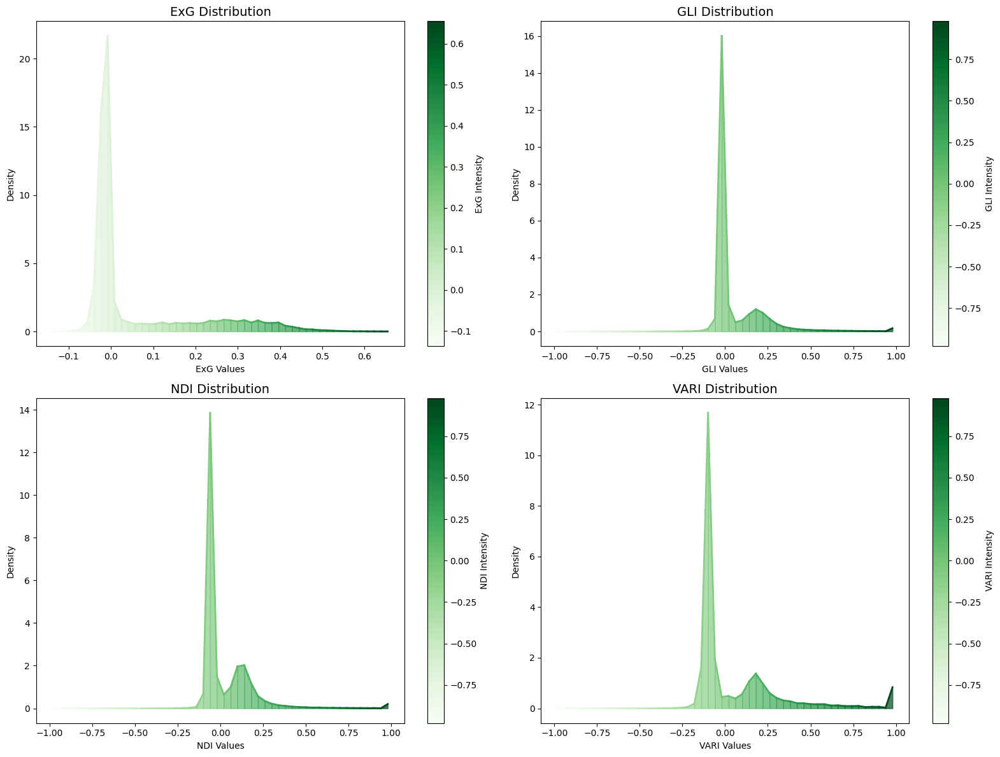

Vegetation Index Statistics:


,count,mean,std,min,25%,50%,75%,max,Range
ExG,667000.0,0.055384,0.134359,-0.145098,-0.019608,-0.011765,0.070588,0.662745,0.807843
GLI,667000.0,0.058135,0.155170,-0.999909,-0.009709,-0.005814,0.069182,0.999966,1.999875
NDI,667000.0,0.026133,0.155257,-0.999909,-0.057750,-0.047619,0.101561,0.999933,1.999842
VARI,667000.0,0.054006,0.276439,-1.000000,-0.101264,-0.084820,0.165047,1.000000,2.000000
TVI,667000.0,0.353269,0.105551,0.000000,0.330539,0.358084,0.380838,1.000000,1.000000


In [ ]:
import pandas as pd
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap

# Define colormap
colormap = plt.get_cmap("Greens")  # Use a perceptually uniform colormap

vegetation_indices = indices

# Create a DataFrame for easier analysis
data_dict = {key: value.ravel() for key, value in vegetation_indices.items()}  # Flatten arrays
vegetation_df = pd.DataFrame(data_dict)

# Plot histograms for each vegetation index
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, (index_name, index_values) in zip(axes.ravel(), vegetation_indices.items()):
    # Compute histogram data
    counts, bin_edges = np.histogram(index_values.ravel(), bins=50, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Calculate bin centers

    # Apply colormap based on bin values
    norm = Normalize(vmin=bin_centers.min(), vmax=bin_centers.max())
    colors = colormap(norm(bin_centers))

    # Plot the line graph
    for i in range(len(bin_centers) - 1):
        ax.fill_between(bin_centers[i:i + 2], counts[i:i + 2], color=colors[i], alpha=0.7)
        ax.plot(bin_centers[i:i + 2], counts[i:i + 2], color=colors[i], linewidth=2)

    # Add a colorbar for context
    sm = ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label(f"{index_name} Intensity", fontsize=10)

    # Titles and labels
    ax.set_title(f"{index_name} Distribution", fontsize=14)
    ax.set_xlabel(f"{index_name} Values")
    ax.set_ylabel("Density")

plt.tight_layout()
plt.show()

# Display statistics for vegetation indices
print("Vegetation Index Statistics:")
summary_stats = vegetation_df.describe().T  # Transpose for easier readability
summary_stats["Range"] = summary_stats["max"] - summary_stats["min"]  # Add range
display(summary_stats)


## Data Preparation

### Morphological Operations
- **Erosion**: Removes small noise or shrinks objects.
- **Dilation**: Expands object boundaries.
- **Opening** (Erosion → Dilation): Removes small objects/noise.
- **Closing** (Dilation → Erosion): Fills small holes in objects.

In [7]:
from skimage.morphology import erosion, dilation, opening, closing, disk

# Interactive function
def interactive_morphology(threshold):
    """
    Visualize morphological operations interactively with adjustable threshold.
    
    Parameters:
    - threshold: Threshold for creating the binary mask from the ExG index.
    """

    # Clear any previous plots
    plt.close('all')

    # Create binary mask
    exg = indices["ExG"]
    binary_mask = exg > threshold

    # Structuring element
    selem = disk(radius=3)  # Adjust size of the structuring element

    # Apply morphological operations
    eroded = erosion(binary_mask, selem)
    dilated = dilation(binary_mask, selem)
    opened = opening(binary_mask, selem)
    closed = closing(binary_mask, selem)

    # Visualize results in two rows
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Row 1: Erosion and Dilation
    axes[0, 0].imshow(eroded, cmap='gray')
    axes[0, 0].set_title("Erosion")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(dilated, cmap='gray')
    axes[0, 1].set_title("Dilation")
    axes[0, 1].axis("off")

    # Row 2: Opening and Closing
    axes[1, 0].imshow(opened, cmap='gray')
    axes[1, 0].set_title("Opening")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(closed, cmap='gray')
    axes[1, 1].set_title("Closing")
    axes[1, 1].axis("off")

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Create an interactive slider for threshold adjustment
interact(
    interactive_morphology,
    threshold=FloatSlider(value=0.2, min=0.0, max=1.0, step=0.01, description="Threshold")
);


interactive(children=(FloatSlider(value=0.2, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

### Noise Reduction

Apply filters to reduce noise and smooth the image while preserving edges.
- **Gaussian Blur**: Smooths the image while preserving general features.
- **Median Filter**: Removes salt-and-pepper noise.
- **Bilateral Filter**: Smooths while preserving edges.

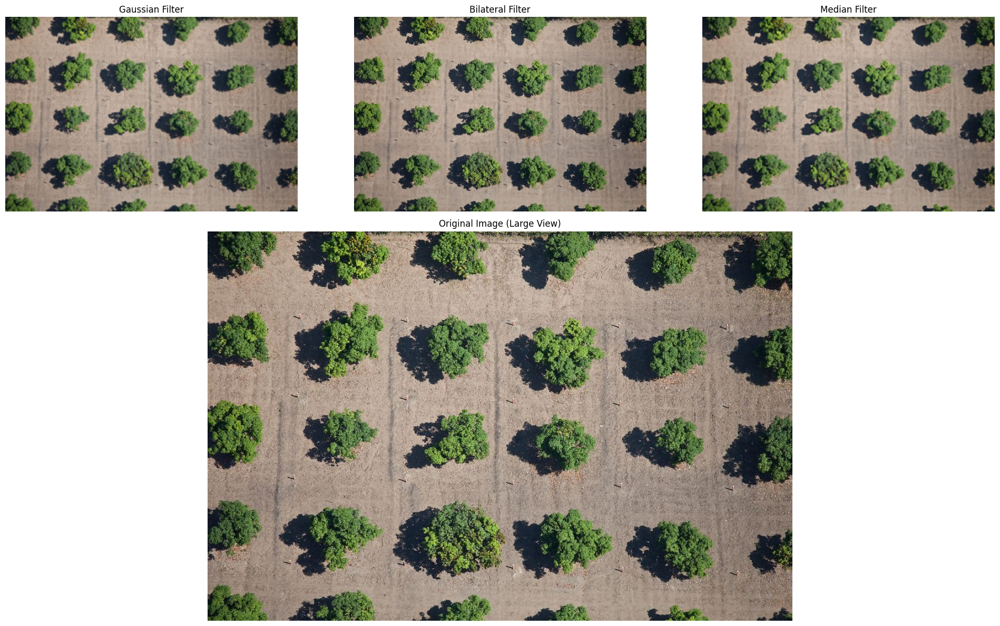

In [ ]:

# Filtering parameters
bl_sigma_color = 50
bl_sigma_spatial = 15 # Lower number is faster


image_uint8 = (image).astype(np.uint8)

# Apply filters
gaussian_smoothed = cv2.GaussianBlur(image_uint8, ksize=(5, 5), sigmaX=2)
median_smoothed = cv2.medianBlur(image_uint8, ksize=5)  # ksize must be an odd number
bilateral_smoothed = cv2.bilateralFilter(
    image_uint8, d=9, 
    sigmaColor=bl_sigma_color, 
    sigmaSpace=bl_sigma_spatial
)


# PLOTTING
fig = plt.figure(figsize=(20, 12))
gs = GridSpec(2, 3, height_ratios=[1, 2])  # Row 1: smaller; Row 2: larger

# First row: Filters
ax1 = fig.add_subplot(gs[0, 0])
ax1.imshow(gaussian_smoothed)
ax1.set_title("Gaussian Filter")
ax1.axis("off")

ax2 = fig.add_subplot(gs[0, 1])
ax2.imshow(bilateral_smoothed)
ax2.set_title("Bilateral Filter")
ax2.axis("off")

ax3 = fig.add_subplot(gs[0, 2])
ax3.imshow(median_smoothed)
ax3.set_title("Median Filter")
ax3.axis("off")

# Second row: Enlarged original image
ax4 = fig.add_subplot(gs[1, :])  # Span all 3 columns
ax4.imshow(image_uint8)
ax4.set_title("Original Image (Large View)")
ax4.axis("off")

# Adjust layout
plt.tight_layout()
plt.show()


### Contrast Enhancement

Improve the contrast of the image to better distinguish plant regions.

- **Histogram Equalization**: Enhances contrast by spreading intensity values across the range.
- **CLAHE** (Contrast Limited Adaptive Histogram Equalization): Performs local contrast enhancement to avoid over-amplification.

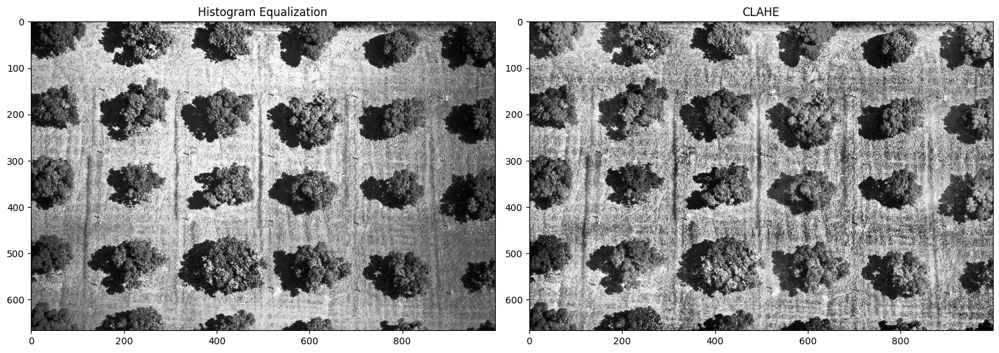

In [ ]:
from skimage.exposure import equalize_hist, equalize_adapthist

# Apply histogram equalization
equalized = equalize_hist(l_channel)  # Apply to L channel (lightness)
clahe = equalize_adapthist(l_channel, clip_limit=0.03)  # CLAHE

# Visualize results
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes[0].imshow(equalized, cmap='gray')
axes[0].set_title("Histogram Equalization")
axes[1].imshow(clahe, cmap='gray')
axes[1].set_title("CLAHE")
plt.tight_layout()
plt.show()


## Example Pipeline

This is a quick demonstration of where these pre-processing steps will come in for a real application. Here, we take our original image, find the ExG vegetation index, then perform filtering to reduce noise while preserving our edges.  

We also increased the contrast to make vegetation areas stand out more from the background (hardly needed, in this case). We used opening to remove small non-vegetation regions, then
closing to fill back in small gaps.

Finally, we used thresholding to determine which parts of the image are or are not the plants we are looking for. The last plot shows how we did, with the detected regions overlaid on the original image for comparisson.

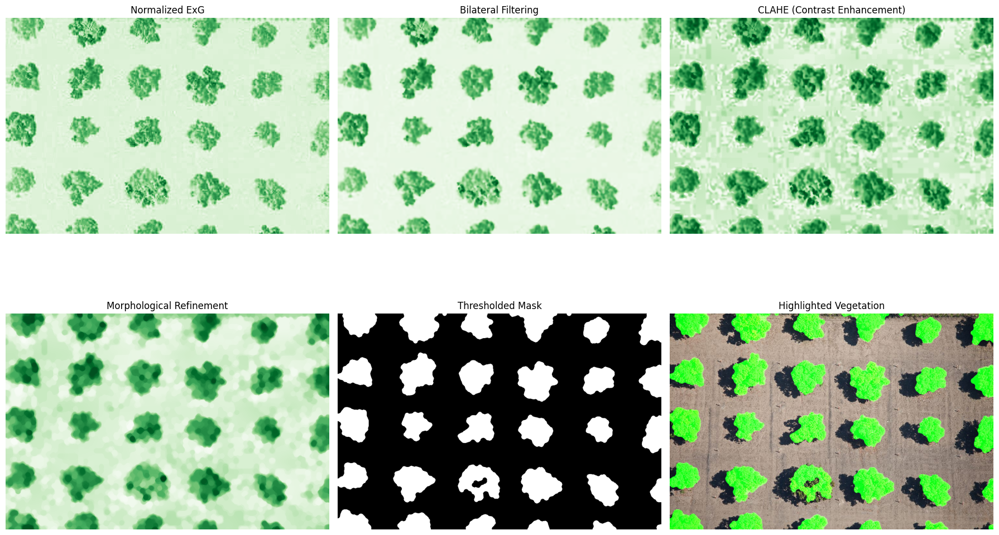

In [ ]:
from skimage.exposure import equalize_adapthist
from skimage.filters import threshold_otsu
from skimage.morphology import opening, closing, disk

# Normalize ExG to the range [0, 255] for OpenCV compatibility
exg = indices["ExG"] # From the Vegetation Indices section above
exg_normalized = (exg - np.min(exg)) / (np.max(exg) - np.min(exg))  # Normalize to [0, 1]
exg_uint8 = (exg_normalized * 255).astype(np.uint8)


bl_sigma_color = 50
bl_sigma_spatial = 15 # Lower number is faster

# Step 1: Bilateral Filtering using OpenCV
bilateral_smoothed_exg = cv2.bilateralFilter(
    exg_uint8 , d=9, 
    sigmaColor=bl_sigma_color, 
    sigmaSpace=bl_sigma_spatial
)
bilateral_smoothed_exg = bilateral_smoothed_exg / 255.0  # Scale back to [0, 1]

# Step 2: Contrast Enhancement with CLAHE
clahe_exg = equalize_adapthist(bilateral_smoothed_exg, clip_limit=0.03)

# Step 3: Morphological Operations (Opening → Closing)
selem = disk(7)  # Structuring element
morph_exg = closing(opening(clahe_exg, selem), selem)

# Step 4: Thresholding (Otsu's method)
otsu_threshold = threshold_otsu(morph_exg)
binary_mask = morph_exg > otsu_threshold

# Visualize the Pipeline
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes[0, 0].imshow(exg_normalized, cmap='Greens')
axes[0, 0].set_title("Normalized ExG")
axes[0, 0].axis("off")

axes[0, 1].imshow(bilateral_smoothed_exg, cmap='Greens')
axes[0, 1].set_title("Bilateral Filtering")
axes[0, 1].axis("off")

axes[0, 2].imshow(clahe_exg, cmap='Greens')
axes[0, 2].set_title("CLAHE (Contrast Enhancement)")
axes[0, 2].axis("off")

axes[1, 0].imshow(morph_exg, cmap='Greens')
axes[1, 0].set_title("Morphological Refinement")
axes[1, 0].axis("off")

axes[1, 1].imshow(binary_mask, cmap='gray')
axes[1, 1].set_title("Thresholded Mask")
axes[1, 1].axis("off")


highlighted_image = image.copy() * 255
# Enhance the mask regions with green (or any desired enhancement)
highlighted_image[binary_mask, 1] = 1.0  # Max out the green channel for mask regions

# axes[1, 2].imshow(np.clip(highlighted, 0, 1))
axes[1, 2].imshow(highlighted_image * 255)
axes[1, 2].set_title("Highlighted Vegetation")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()


In [11]:
from skimage.io import imsave

# Save binary mask as a PNG image (scaled to [0, 255] for visualization)
imsave("../outputs/binary_mask.png", (binary_mask * 255).astype(np.uint8))

print("Binary mask saved as 'binary_mask.png' to the outputs directory.")


Binary mask saved as 'binary_mask.png' to the outputs directory.


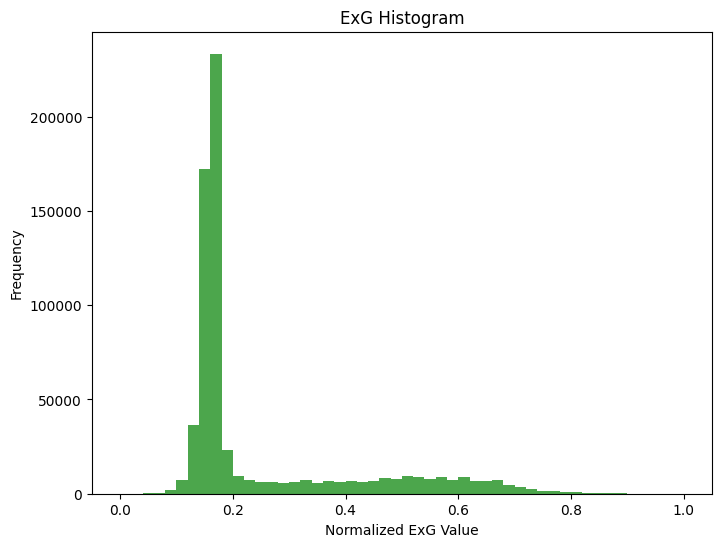

ExG Statistics:
Mean: 0.25
Standard Deviation: 0.17
Min: 0.00, Max: 1.00


In [ ]:
# Histogram for ExG
plt.figure(figsize=(8, 6))
plt.hist(exg_normalized.ravel(), bins=50, color='green', alpha=0.7)
plt.title("ExG Histogram")
plt.xlabel("Normalized ExG Value")
plt.ylabel("Frequency")
plt.show()

# Summary statistics
print("ExG Statistics:")
print(f"Mean: {np.mean(exg_normalized):.2f}")
print(f"Standard Deviation: {np.std(exg_normalized):.2f}")
print(f"Min: {np.min(exg_normalized):.2f}, Max: {np.max(exg_normalized):.2f}")


## TODO

Possible sections to add:
- EDA	Understand image characteristics for better tuning.
- Cropping	Focus on specific regions of interest (ROI).
- Advanced Filters	Handle complex noise and improve image clarity.
- Augmentation	Simulate diverse conditions for robustness.
- Interactive Tuning	Fine-tune preprocessing parameters dynamically.
- Pipeline Validation	Test preprocessing on diverse image samples.